# EDA of Data From CarDekho.com

This dataset contains information about used cars listed on www.cardekho.com

The columns in the given dataset are as follows:

name

year

selling_price

km_driven

fuel

seller_type

transmission

Owner

In [1]:
#importing Required library
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
#importing plotly Library
from plotly.offline import iplot
import plotly as py
import plotly.tools as tls
import cufflinks as cf
py.offline.init_notebook_mode(connected=True) #Turning on notebook mode
cf.go_offline()

In [3]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'colab'
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [4]:
df=pd.read_csv(r"CAR DETAILS FROM CAR DEKHO.csv") #dataset

In [5]:
df.shape

(4340, 8)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4340 entries, 0 to 4339
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   name           4340 non-null   object
 1   year           4340 non-null   int64 
 2   selling_price  4340 non-null   int64 
 3   km_driven      4340 non-null   int64 
 4   fuel           4340 non-null   object
 5   seller_type    4340 non-null   object
 6   transmission   4340 non-null   object
 7   owner          4340 non-null   object
dtypes: int64(3), object(5)
memory usage: 271.4+ KB


In [7]:
df.describe()

,year,selling_price,km_driven
count,4340.000000,4.340000e+03,4340.000000
mean,2013.090783,5.041273e+05,66215.777419
std,4.215344,5.785487e+05,46644.102194
min,1992.000000,2.000000e+04,1.000000
25%,2011.000000,2.087498e+05,35000.000000
50%,2014.000000,3.500000e+05,60000.000000
75%,2016.000000,6.000000e+05,90000.000000
max,2020.000000,8.900000e+06,806599.000000


In [8]:
df.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
0,Maruti 800 AC,2007,60000,70000,Petrol,Individual,Manual,First Owner
1,Maruti Wagon R LXI Minor,2007,135000,50000,Petrol,Individual,Manual,First Owner
2,Hyundai Verna 1.6 SX,2012,600000,100000,Diesel,Individual,Manual,First Owner
3,Datsun RediGO T Option,2017,250000,46000,Petrol,Individual,Manual,First Owner
4,Honda Amaze VX i-DTEC,2014,450000,141000,Diesel,Individual,Manual,Second Owner


In [9]:
df.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
4335,Hyundai i20 Magna 1.4 CRDi (Diesel),2014,409999,80000,Diesel,Individual,Manual,Second Owner
4336,Hyundai i20 Magna 1.4 CRDi,2014,409999,80000,Diesel,Individual,Manual,Second Owner
4337,Maruti 800 AC BSIII,2009,110000,83000,Petrol,Individual,Manual,Second Owner
4338,Hyundai Creta 1.6 CRDi SX Option,2016,865000,90000,Diesel,Individual,Manual,First Owner
4339,Renault KWID RXT,2016,225000,40000,Petrol,Individual,Manual,First Owner


In [10]:
df.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0


In [11]:
df['Age'] = 2022 - df['year']
df.drop('year',axis=1,inplace = True)

In [12]:
df.head()

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age
0,Maruti 800 AC,60000,70000,Petrol,Individual,Manual,First Owner,15
1,Maruti Wagon R LXI Minor,135000,50000,Petrol,Individual,Manual,First Owner,15
2,Hyundai Verna 1.6 SX,600000,100000,Diesel,Individual,Manual,First Owner,10
3,Datsun RediGO T Option,250000,46000,Petrol,Individual,Manual,First Owner,5
4,Honda Amaze VX i-DTEC,450000,141000,Diesel,Individual,Manual,Second Owner,8


In [13]:
pd.set_option("display.max_rows", None, "display.max_columns",None)
df

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age
0,Maruti 800 AC,60000,70000,Petrol,Individual,Manual,First Owner,15
1,Maruti Wagon R LXI Minor,135000,50000,Petrol,Individual,Manual,First Owner,15
2,Hyundai Verna 1.6 SX,600000,100000,Diesel,Individual,Manual,First Owner,10
3,Datsun RediGO T Option,250000,46000,Petrol,Individual,Manual,First Owner,5
4,Honda Amaze VX i-DTEC,450000,141000,Diesel,Individual,Manual,Second Owner,8
5,Maruti Alto LX BSIII,140000,125000,Petrol,Individual,Manual,First Owner,15
6,Hyundai Xcent 1.2 Kappa S,550000,25000,Petrol,Individual,Manual,First Owner,6
7,Tata Indigo Grand Petrol,240000,60000,Petrol,Individual,Manual,Second Owner,8
8,Hyundai Creta 1.6 VTVT S,850000,25000,Petrol,Individual,Manual,First Owner,7
9,Maruti Celerio Green VXI,365000,78000,CNG,Individual,Manual,First Owner,5


In [14]:
df.describe()

,selling_price,km_driven,Age
count,4.340000e+03,4340.000000,4340.000000
mean,5.041273e+05,66215.777419,8.909217
std,5.785487e+05,46644.102194,4.215344
min,2.000000e+04,1.000000,2.000000
25%,2.087498e+05,35000.000000,6.000000
50%,3.500000e+05,60000.000000,8.000000
75%,6.000000e+05,90000.000000,11.000000
max,8.900000e+06,806599.000000,30.000000


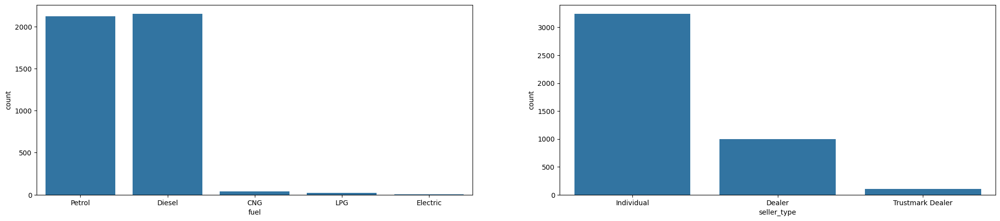

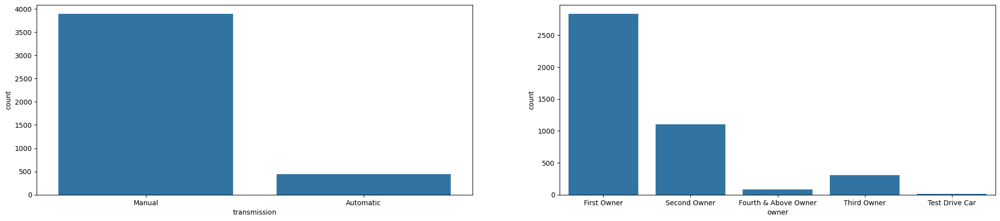

In [15]:
cat_cols = ['fuel','seller_type','transmission','owner']
i=0
while i < 4:
    fig = plt.figure(figsize=[25,5])

    plt.subplot(1,2,1)
    sns.countplot(x=cat_cols[i], data=df)
    i += 1

    plt.subplot(1,2,2)
    sns.countplot(x=cat_cols[i], data=df)
    i += 1

    plt.show()

1. Number of petrol car & Disel car almost equal
2. CNG LPG & Electric Car have very few listing
3. Most of the listing are by Individual then followed by dealer
4. listing of manual cars are very high as compared to automatic
5. listing of first owner car is high then follwed by second owner

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4340 entries, 0 to 4339
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   name           4340 non-null   object
 1   selling_price  4340 non-null   int64 
 2   km_driven      4340 non-null   int64 
 3   fuel           4340 non-null   object
 4   seller_type    4340 non-null   object
 5   transmission   4340 non-null   object
 6   owner          4340 non-null   object
 7   Age            4340 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 271.4+ KB


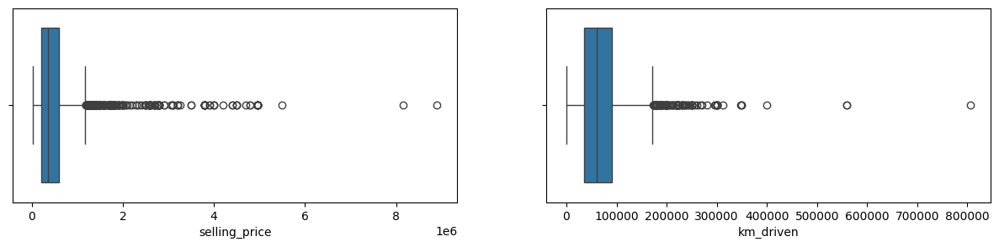

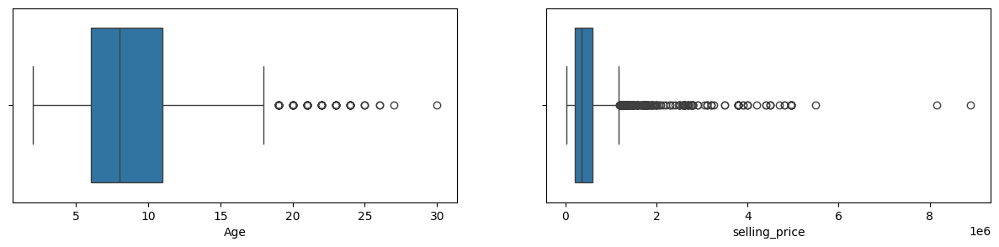

In [17]:
num_cols = ['selling_price','km_driven','Age','selling_price']
i=0
while i < 4:
    fig = plt.figure(figsize=[15,3])

    plt.subplot(1,2,1)
    sns.boxplot(x=num_cols[i], data=df)
    i += 1


    plt.subplot(1,2,2)
    sns.boxplot(x=num_cols[i], data=df)
    i += 1

    plt.show()

Dataset has lots of outliers

In [18]:
df['selling_price'].quantile(0.99)

3200000.0

# Outliers in selling price

In [19]:
df[df['selling_price'] > df['selling_price'].quantile(0.99)].sort_values(by="selling_price",ascending=False)

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age
3872,Audi RS7 2015-2019 Sportback Performance,8900000,13000,Petrol,Dealer,Automatic,First Owner,6
89,Mercedes-Benz S-Class S 350d Connoisseurs Edition,8150000,6500,Diesel,Dealer,Automatic,First Owner,5
3969,Mercedes-Benz GLS 2016-2020 350d 4MATIC,5500000,77350,Diesel,Dealer,Automatic,First Owner,6
612,BMW X5 xDrive 30d xLine,4950000,30000,Diesel,Dealer,Automatic,First Owner,3
1836,BMW X5 xDrive 30d xLine,4950000,30000,Diesel,Dealer,Automatic,First Owner,3
2258,BMW X5 xDrive 30d xLine,4950000,30000,Diesel,Dealer,Automatic,First Owner,3
1023,BMW X5 xDrive 30d xLine,4950000,30000,Diesel,Dealer,Automatic,First Owner,3
2739,BMW X5 xDrive 30d xLine,4950000,30000,Diesel,Dealer,Automatic,First Owner,3
919,BMW X5 xDrive 30d xLine,4950000,30000,Diesel,Dealer,Automatic,First Owner,3
2239,BMW X5 xDrive 30d xLine,4950000,30000,Diesel,Dealer,Automatic,First Owner,3


Dataset also has  premium cars

Highest Selling price is  89,00,000

In [20]:
df[df['km_driven'] > df['km_driven'].quantile(0.99)].sort_values(by="km_driven",ascending=False)

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age
1243,Maruti Swift VXI BSIII,250000,806599,Petrol,Dealer,Manual,First Owner,13
4184,Maruti SX4 S Cross DDiS 320 Delta,665000,560000,Diesel,Dealer,Manual,First Owner,6
525,Maruti SX4 S Cross DDiS 320 Delta,665000,560000,Diesel,Dealer,Manual,First Owner,6
3679,Toyota Innova 2.5 G (Diesel) 7 Seater BS IV,400000,400000,Diesel,Individual,Manual,Third Owner,16
69,Chevrolet Tavera Neo LS B3 - 7(C) seats BSIII,280000,350000,Diesel,Individual,Manual,Second Owner,12
2394,Toyota Innova 2.5 V Diesel 8-seater,350000,350000,Diesel,Individual,Manual,First Owner,13
3718,Toyota Innova 2.5 GX 8 STR BSIV,420000,347089,Diesel,Dealer,Manual,First Owner,13
1674,Volkswagen Jetta 2.0 TDI Comfortline,350000,312000,Diesel,Individual,Manual,Third Owner,11
1101,Tata Indica DLS,85000,300000,Diesel,Individual,Manual,Second Owner,16
3994,Tata Indica GLS BS IV,75000,300000,Petrol,Individual,Manual,Third Owner,12


Highest km_driven is 8,06,599

In [21]:
df[df['Age'] > df['Age'].quantile(0.99)].sort_values(by="Age",ascending=False)

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age
3334,Maruti 800 AC BSII,50000,100000,Petrol,Individual,Manual,Fourth & Above Owner,30
631,Maruti Gypsy E MG410W ST,95000,100000,Petrol,Individual,Manual,Second Owner,27
61,Mahindra Jeep CL 500 MDI,250000,35000,Diesel,Individual,Manual,Second Owner,26
2972,Mahindra Jeep MM 540,200000,60000,Diesel,Individual,Manual,First Owner,26
3550,Maruti Esteem AX,79000,70000,Petrol,Individual,Automatic,First Owner,25
3661,Maruti 800 Std,50000,80000,Petrol,Individual,Manual,Second Owner,25
1669,Mahindra Jeep CL 500 MDI,150000,120000,Diesel,Individual,Manual,Third Owner,25
2044,Mercedes-Benz E-Class 230,1000000,35000,Petrol,Individual,Automatic,Second Owner,24
3371,Honda City 1.3 EXI,85000,120000,Petrol,Individual,Manual,Second Owner,24
3237,Maruti 800 Std,40000,40000,Petrol,Individual,Manual,Fourth & Above Owner,24


Highest age of car is 30 Years

In [22]:
df.sort_values(by="selling_price")

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age
2662,Ford Ikon 1.6 ZXI NXt,20000,25000,Petrol,Individual,Manual,Second Owner,17
2495,Ford Ikon 1.4 ZXi,22000,42743,Petrol,Dealer,Manual,Third Owner,22
2444,Maruti 800 EX,30000,60000,Petrol,Individual,Manual,Third Owner,18
3206,OpelCorsa 1.4 GL,35000,100000,Petrol,Individual,Manual,Third Owner,20
2849,Tata Nano Std BSII,35000,50000,Petrol,Individual,Manual,Third Owner,13
1832,Tata Nano LX SE,35000,35000,Petrol,Individual,Manual,Third Owner,10
4290,Maruti 800 Std,37500,90000,Petrol,Individual,Manual,Second Owner,18
877,Tata Nano Std,40000,19000,Petrol,Individual,Manual,First Owner,11
3215,Maruti 800 AC,40000,69111,Petrol,Individual,Manual,Third Owner,18
2730,Tata Nano Lx,40000,90000,Petrol,Individual,Manual,First Owner,12


In [24]:
df["selling_price"].value_counts().sort_values(ascending=False).head(10).iplot(kind="bar")

Maruti swift Dzire VDI have the highest listing in used cars

In [25]:
fuel=df.groupby(by="fuel")

In [26]:
fuel.selling_price.mean().sort_values(ascending=False).iplot(kind="bar")

Disel Car have highest average selling price

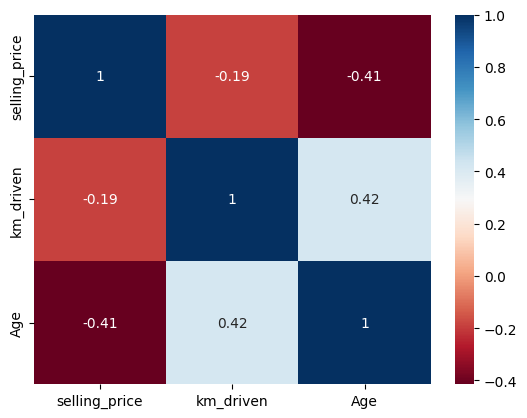

In [27]:
sns.heatmap(df.select_dtypes(include=np.number).corr(), annot=True, cmap="RdBu")
plt.show()

In [28]:
owner=df.groupby(by="owner")

In [29]:
owner.selling_price.mean().sort_values(ascending=False).iplot(kind="bar")

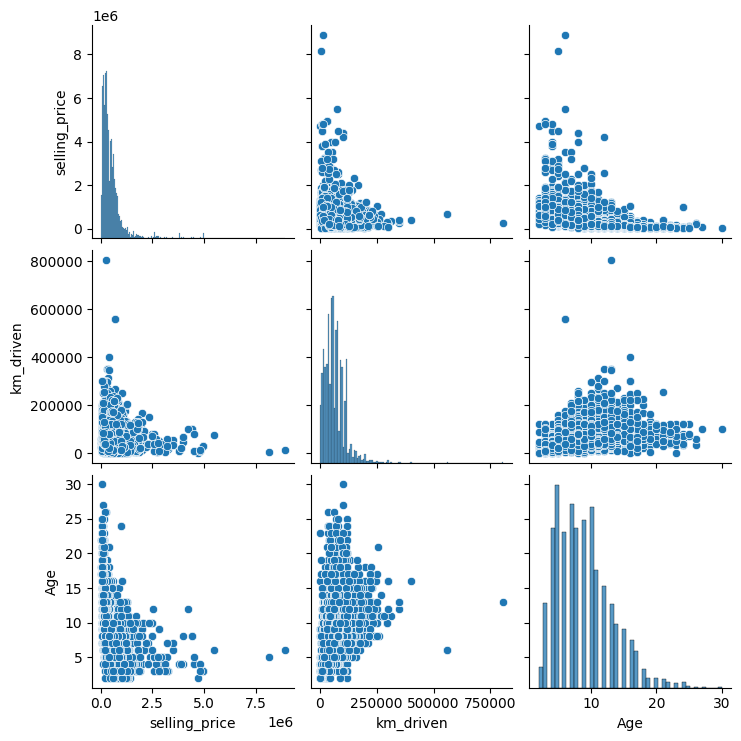

In [30]:
sns.pairplot(df)

In [31]:
df.shape

(4340, 8)

In [32]:
car_names=df["name"].unique()

In [33]:
df["name"].nunique()

1491

In [34]:
pd.DataFrame(car_names)

,0
0,Maruti 800 AC
1,Maruti Wagon R LXI Minor
2,Hyundai Verna 1.6 SX
3,Datsun RediGO T Option
4,Honda Amaze VX i-DTEC
5,Maruti Alto LX BSIII
6,Hyundai Xcent 1.2 Kappa S
7,Tata Indigo Grand Petrol
8,Hyundai Creta 1.6 VTVT S
9,Maruti Celerio Green VXI


In [35]:
df['brand'] = df['name'].str.split(' ').str[0]

In [36]:
df

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age,brand
0,Maruti 800 AC,60000,70000,Petrol,Individual,Manual,First Owner,15,Maruti
1,Maruti Wagon R LXI Minor,135000,50000,Petrol,Individual,Manual,First Owner,15,Maruti
2,Hyundai Verna 1.6 SX,600000,100000,Diesel,Individual,Manual,First Owner,10,Hyundai
3,Datsun RediGO T Option,250000,46000,Petrol,Individual,Manual,First Owner,5,Datsun
4,Honda Amaze VX i-DTEC,450000,141000,Diesel,Individual,Manual,Second Owner,8,Honda
5,Maruti Alto LX BSIII,140000,125000,Petrol,Individual,Manual,First Owner,15,Maruti
6,Hyundai Xcent 1.2 Kappa S,550000,25000,Petrol,Individual,Manual,First Owner,6,Hyundai
7,Tata Indigo Grand Petrol,240000,60000,Petrol,Individual,Manual,Second Owner,8,Tata
8,Hyundai Creta 1.6 VTVT S,850000,25000,Petrol,Individual,Manual,First Owner,7,Hyundai
9,Maruti Celerio Green VXI,365000,78000,CNG,Individual,Manual,First Owner,5,Maruti


In [37]:
df.brand.unique()

array(['Maruti', 'Hyundai', 'Datsun', 'Honda', 'Tata', 'Chevrolet',
       'Toyota', 'Jaguar', 'Mercedes-Benz', 'Audi', 'Skoda', 'Jeep',
       'BMW', 'Mahindra', 'Ford', 'Nissan', 'Renault', 'Fiat',
       'Volkswagen', 'Volvo', 'Mitsubishi', 'Land', 'Daewoo', 'MG',
       'Force', 'Isuzu', 'OpelCorsa', 'Ambassador', 'Kia'], dtype=object)

In [38]:
df.brand.nunique()

29

In [39]:
df.brand.value_counts().sort_values(ascending=False).iplot(kind="bar")

In [40]:
df.brand.value_counts().sort_values().head(15).iplot(kind="bar")

In [41]:
df[df.selling_price>2500000].sort_values(by="selling_price").brand.unique()

array(['Jaguar', 'Audi', 'Toyota', 'BMW', 'Ford', 'Mahindra', 'Land',
       'Mercedes-Benz', 'Volvo'], dtype=object)

# Analysis of premium segment cars

In [42]:
top_brands=['Jaguar', 'Audi', 'BMW','Land','Mercedes-Benz', 'Volvo']


In [43]:
df[df["brand"] == 'Audi']

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age,brand
32,Audi Q5 2.0 TDI,1190000,175900,Diesel,Dealer,Automatic,First Owner,11,Audi
35,Audi A6 2.0 TDI Design Edition,1735000,50000,Diesel,Dealer,Automatic,First Owner,9,Audi
44,Audi Q7 35 TDI Quattro Premium,1250000,78000,Diesel,Dealer,Automatic,Third Owner,13,Audi
94,Audi A6 2.0 TDI Premium Plus,1470000,34000,Diesel,Dealer,Automatic,Second Owner,8,Audi
96,Audi A8 4.2 TDI,2800000,49000,Diesel,Dealer,Automatic,First Owner,9,Audi
99,Audi A4 2.0 TDI 177 Bhp Premium Plus,1150000,53000,Diesel,Dealer,Automatic,First Owner,9,Audi
431,Audi Q5 2.0 TDI,1350000,90000,Diesel,Individual,Automatic,Second Owner,10,Audi
554,Audi A4 3.0 TDI Quattro,1580000,86000,Diesel,Dealer,Automatic,First Owner,9,Audi
566,Audi A6 2.0 TDI Premium Plus,1300000,58500,Diesel,Dealer,Automatic,First Owner,9,Audi
573,Audi A4 3.0 TDI Quattro,1580000,86000,Diesel,Dealer,Automatic,First Owner,9,Audi


In [44]:
tdf=df.loc[df['brand'].isin(top_brands)]

In [45]:
tdf.shape

(149, 9)

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4340 entries, 0 to 4339
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   name           4340 non-null   object
 1   selling_price  4340 non-null   int64 
 2   km_driven      4340 non-null   int64 
 3   fuel           4340 non-null   object
 4   seller_type    4340 non-null   object
 5   transmission   4340 non-null   object
 6   owner          4340 non-null   object
 7   Age            4340 non-null   int64 
 8   brand          4340 non-null   object
dtypes: int64(3), object(6)
memory usage: 305.3+ KB


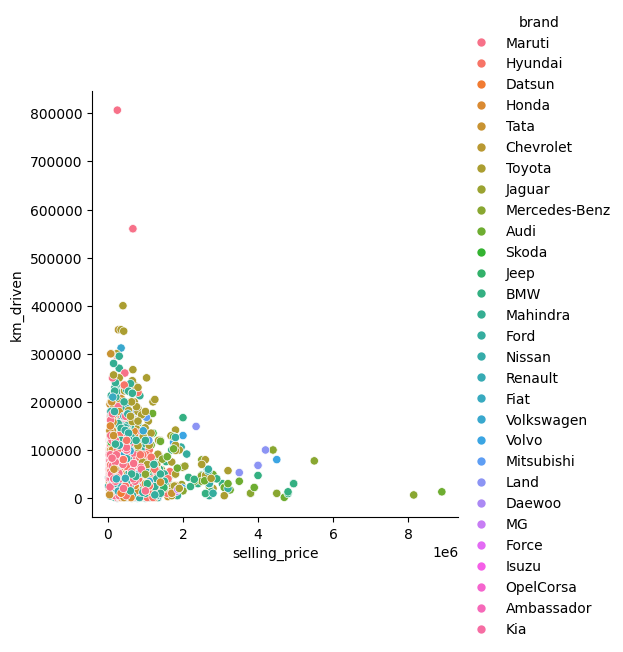

In [47]:
sns.relplot(x=df.selling_price,y=df.km_driven,hue=df.brand)

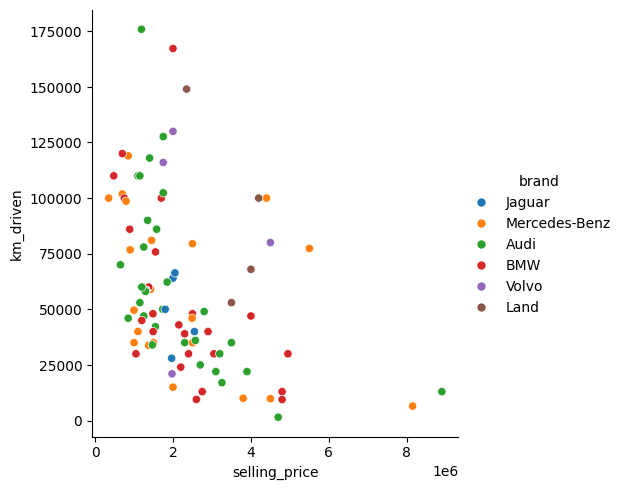

In [48]:
sns.relplot(x=tdf.selling_price,y=tdf.km_driven,hue=tdf.brand)

In [49]:
tdf.brand.value_counts().sort_values(ascending=False).iplot(kind="bar")

In [50]:
# Calculate the average selling price per brand
brand_avg_prices = tdf.groupby('brand')['selling_price'].mean().sort_values()

# Create a new DataFrame for plotting
plot_df = pd.DataFrame({
    'Brand': brand_avg_prices.index,
    'Average Selling Price': brand_avg_prices.values
})

# Create the bar chart using Plotly Express
fig = px.bar(
    plot_df,
    x='Brand',
    y='Average Selling Price',
    title='Average Selling Price of Premium Cars by Brand'
)

import plotly.io as pio
pio.renderers.default = 'colab'

fig.show()


Audi BMW & Mercedes-Benz listing are higher in premium cars.

In [51]:
topcars=tdf.groupby("brand")

In [52]:
topcars.mean(numeric_only=True).sort_values(by="selling_price").iplot(kind="bar")

Averge selling price of audi is lowest compared other premium car

In [53]:
topcars.mean(numeric_only=True).sort_values(by="selling_price").sort_values(by="selling_price")

,selling_price,km_driven,Age
brand,,,
Audi,1.931633e+06,64459.716667,8.383333
Jaguar,2.069166e+06,52454.333333,9.833333
Volvo,2.556250e+06,86748.000000,6.750000
Mercedes-Benz,2.776657e+06,42946.571429,8.771429
BMW,2.945385e+06,44883.179487,6.666667
Land,3.609800e+06,87600.000000,7.200000


<Axes: ylabel='count'>

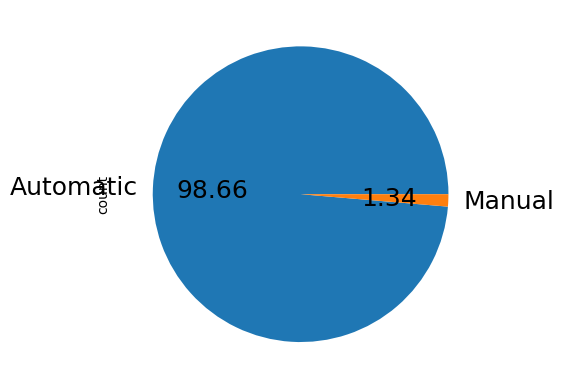

In [54]:
tdf.transmission.value_counts().plot.pie(fontsize = 18, autopct = '%.2f')

<Axes: ylabel='count'>

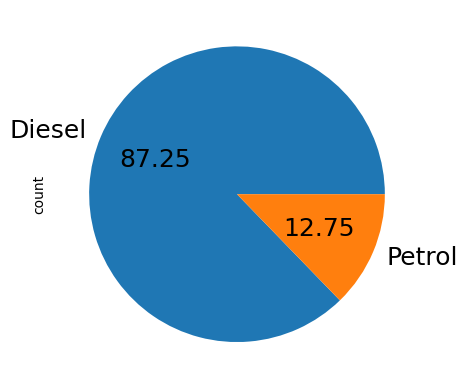

In [55]:
tdf.fuel.value_counts().plot.pie(fontsize = 18, autopct = '%.2f')

most of  cars are diesel in premium cars

<Axes: ylabel='count'>

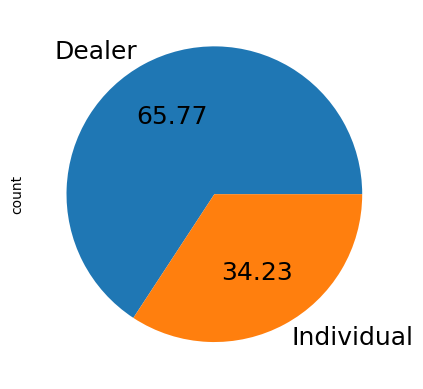

In [56]:
tdf.seller_type.value_counts().plot.pie(fontsize = 18, autopct = '%.2f')

Majority of premium cars are sold by Dealers

In [57]:
tdf.name.value_counts().sort_values(ascending=False).head()

,count
name,
Audi A6 2.0 TDI Premium Plus,13
Audi A4 3.0 TDI Quattro,12
Mercedes-Benz C-Class Progressive C 220d,11
BMW X5 xDrive 30d xLine,11
BMW X1 sDrive 20d xLine,5


This  cars have maximum number of listing in premium car segment.

# Analysis of Normal Segment cars

In [58]:
ndf=df.loc[~df['brand'].isin(top_brands)]

In [59]:
ndf

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,Age,brand
0,Maruti 800 AC,60000,70000,Petrol,Individual,Manual,First Owner,15,Maruti
1,Maruti Wagon R LXI Minor,135000,50000,Petrol,Individual,Manual,First Owner,15,Maruti
2,Hyundai Verna 1.6 SX,600000,100000,Diesel,Individual,Manual,First Owner,10,Hyundai
3,Datsun RediGO T Option,250000,46000,Petrol,Individual,Manual,First Owner,5,Datsun
4,Honda Amaze VX i-DTEC,450000,141000,Diesel,Individual,Manual,Second Owner,8,Honda
5,Maruti Alto LX BSIII,140000,125000,Petrol,Individual,Manual,First Owner,15,Maruti
6,Hyundai Xcent 1.2 Kappa S,550000,25000,Petrol,Individual,Manual,First Owner,6,Hyundai
7,Tata Indigo Grand Petrol,240000,60000,Petrol,Individual,Manual,Second Owner,8,Tata
8,Hyundai Creta 1.6 VTVT S,850000,25000,Petrol,Individual,Manual,First Owner,7,Hyundai
9,Maruti Celerio Green VXI,365000,78000,CNG,Individual,Manual,First Owner,5,Maruti


In [60]:
ndf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4191 entries, 0 to 4339
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   name           4191 non-null   object
 1   selling_price  4191 non-null   int64 
 2   km_driven      4191 non-null   int64 
 3   fuel           4191 non-null   object
 4   seller_type    4191 non-null   object
 5   transmission   4191 non-null   object
 6   owner          4191 non-null   object
 7   Age            4191 non-null   int64 
 8   brand          4191 non-null   object
dtypes: int64(3), object(6)
memory usage: 327.4+ KB


In [61]:
print("Share of Normal Segment Cars in %: ")
print(len(ndf)/len(df)*100)
print("-------------------------------------")
print("Share of premium Segment Cars in % : ")
print(len(tdf)/len(df)*100)

Share of Normal Segment Cars in %: 
96.5668202764977
-------------------------------------
Share of premium Segment Cars in % : 
3.433179723502304


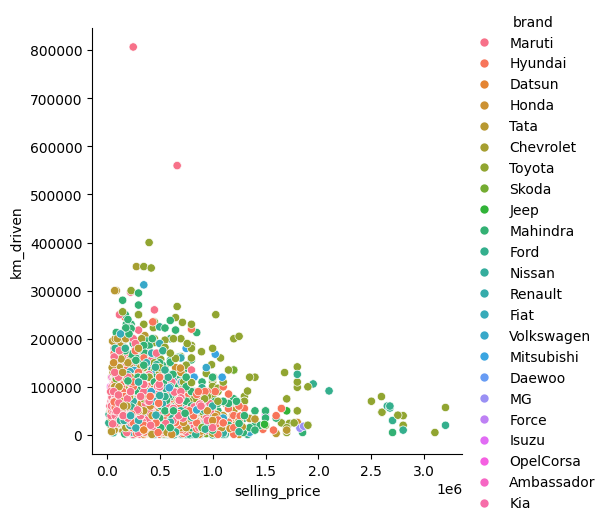

In [62]:
sns.relplot(x=ndf.selling_price,y=ndf.km_driven,hue=ndf.brand)

In [63]:
ndf.brand.value_counts().sort_values(ascending=False).iplot(kind="bar")

Maruti & Hyundai are most popular brands in Normal Car Segment

In [64]:
normalcars=ndf.groupby("brand")

In [65]:
normalcars = ndf.groupby("brand")
# Convert 'selling_price' to numeric before calculating the mean
normalcars.mean(numeric_only=True).sort_values(by="selling_price", ascending=False).iplot(kind="bar")

In [66]:
ndf.transmission.value_counts()

,count
transmission,
Manual,3890
Automatic,301


<Axes: ylabel='count'>

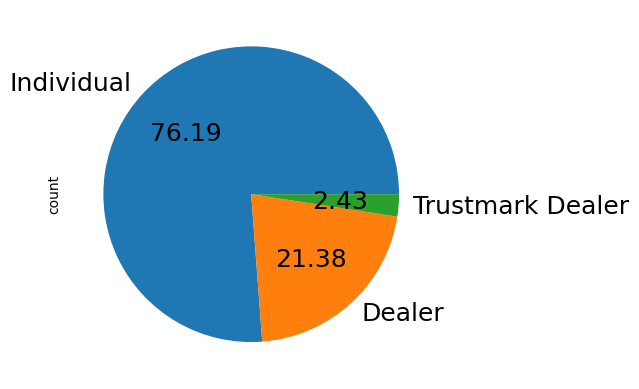

In [67]:
ndf.seller_type.value_counts().plot.pie(fontsize = 18, autopct = '%.2f')

In [68]:
ndf.fuel.value_counts()

,count
fuel,
Petrol,2104
Diesel,2023
CNG,40
LPG,23
Electric,1


<Axes: ylabel='count'>

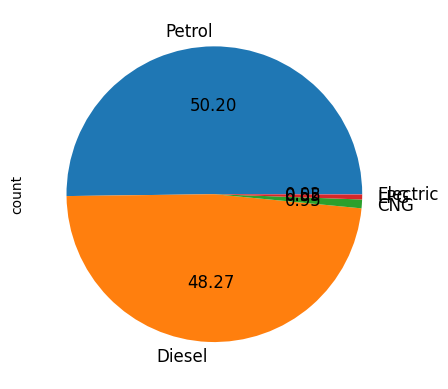

In [69]:
ndf.fuel.value_counts().plot.pie(fontsize = 12, autopct = '%.2f')

<Axes: xlabel='fuel'>

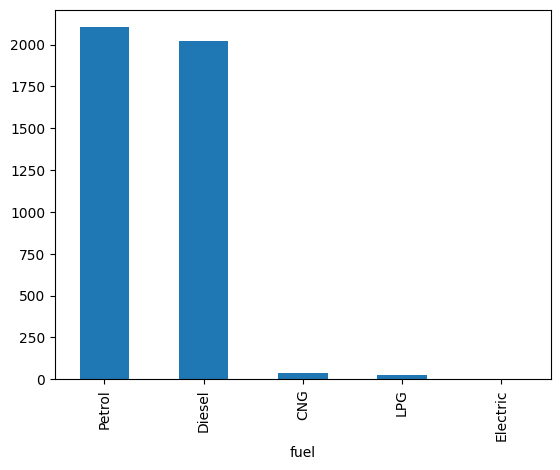

In [70]:
ndf.fuel.value_counts().plot.bar()